In [7]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

from IPython.core.display import display, HTML
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import seaborn as sns
import matplotlib.pyplot as plt
import warnings

# Configure Jupyter Notebook
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', 500) 
pd.set_option('display.expand_frame_repr', False)
display(HTML("<style>div.output_scroll { height: 35em; }</style>"))

%matplotlib inline
%config InlineBackend.figure_format ='retina'

warnings.filterwarnings('ignore')

In [18]:
# df = pd.read_csv('groceries.csv',header=None)

# Loop the data lines
with open(r"C:\Users\j_n_x\groceries.csv", 'r') as temp_f:
    # get No of columns in each line
    col_count = [ len(l.split(",")) for l in temp_f.readlines() ]
    
# Free memory space
del temp_f

# Generate column names  (names will be 0, 1, 2, ..., maximum columns - 1)
column_names = [i for i in range(0, max(col_count))]

# Read csv
df = pd.read_csv(r"C:\Users\j_n_x\groceries.csv", header=None, delimiter=",", names=column_names)

In [19]:
headers = []
for i in range(1,33):
    headers.append('item '+str(i))

df.columns = headers

In [20]:
df.head()

,item 1,item 2,item 3,item 4,item 5,item 6,item 7,item 8,item 9,item 10,item 11,item 12,item 13,item 14,item 15,item 16,item 17,item 18,item 19,item 20,item 21,item 22,item 23,item 24,item 25,item 26,item 27,item 28,item 29,item 30,item 31,item 32
0,citrus fruit,semi-finished bread,margarine,ready soups,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,tropical fruit,yogurt,coffee,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,whole milk,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,pip fruit,yogurt,cream cheese,meat spreads,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,other vegetables,whole milk,condensed milk,long life bakery product,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
text = df.values.astype(str).tolist()
text = [[item for item in row if (str(item) != 'nan')&(item!='')] for row in text]
text_sorted = []
for item in text:
    item.sort()
    text_sorted.append(item)
    
text_sorted[:6]

[['citrus fruit', 'margarine', 'ready soups', 'semi-finished bread'],
 ['coffee', 'tropical fruit', 'yogurt'],
 ['whole milk'],
 ['cream cheese', 'meat spreads', 'pip fruit', 'yogurt'],
 ['condensed milk',
  'long life bakery product',
  'other vegetables',
  'whole milk'],
 ['abrasive cleaner', 'butter', 'rice', 'whole milk', 'yogurt']]

In [22]:
text_sorted_filter_length = []

for item in text_sorted:
    if len(item) > 2:
        text_sorted_filter_length.append(item)

text_sorted_filter_length.sort(key=len)
text_sorted_filter_length[:6]

[['coffee', 'tropical fruit', 'yogurt'],
 ['frankfurter', 'rolls/buns', 'soda'],
 ['beef', 'detergent', 'grapes'],
 ['citrus fruit', 'newspapers', 'zwieback'],
 ['brown bread', 'canned beer', 'packaged fruit/vegetables'],
 ['pastry', 'rolls/buns', 'sugar']]

In [23]:
len(text_sorted_filter_length)

6033

In [24]:
df_plot = pd.DataFrame(pd.Series(text_sorted_filter_length).value_counts()).reset_index()
df_plot

,index,0
0,"[rolls/buns, sausage, soda]",10
1,"[bottled beer, liquor, red/blush wine]",5
2,"[rolls/buns, sausage, whole milk]",4
3,"[bottled beer, liquor, red/blush wine, soda]",4
4,"[pastry, rolls/buns, soda]",4
...,...,...
5916,"[margarine, other vegetables, photo/film, pip ...",1
5917,"[berries, sugar, whipped/sour cream, yogurt]",1
5918,"[beef, butter milk, citrus fruit, curd]",1
5919,"[frozen meals, pip fruit, softener, tropical f...",1


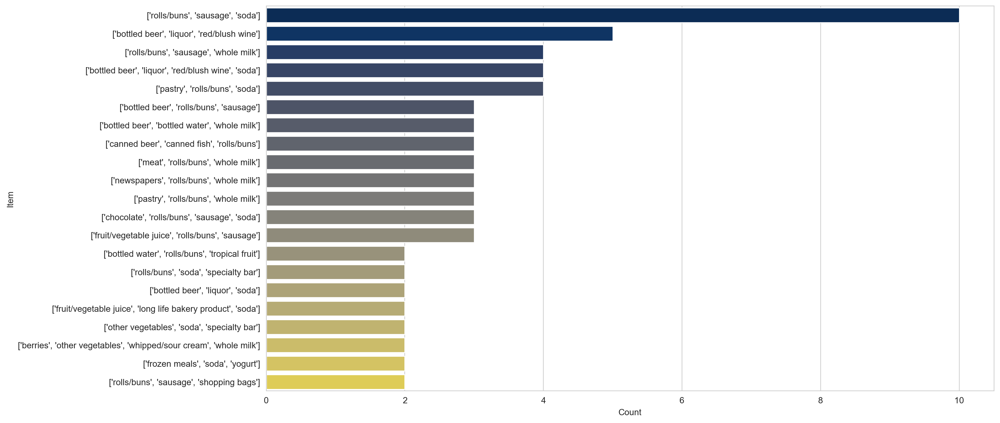

In [25]:
df_plot.columns = ['Item','Count']
df_plot['Item'] = df_plot['Item'].astype(str)
sns.set_style('whitegrid')
plt.figure(figsize=(15,8))
sns.barplot(y='Item', x='Count', data=df_plot[:21], palette='cividis');

In [26]:
df_plot.astype(str).head()

,Item,Count
0,"['rolls/buns', 'sausage', 'soda']",10
1,"['bottled beer', 'liquor', 'red/blush wine']",5
2,"['rolls/buns', 'sausage', 'whole milk']",4
3,"['bottled beer', 'liquor', 'red/blush wine', '...",4
4,"['pastry', 'rolls/buns', 'soda']",4


In [27]:
text = [item for sublist in text for item in sublist]
text = [w.replace(' ', '_') for w in text]
text = [w.replace('/', '_') for w in text]
text.sort()
text[:10]

['Instant_food_products',
 'Instant_food_products',
 'Instant_food_products',
 'Instant_food_products',
 'Instant_food_products',
 'Instant_food_products',
 'Instant_food_products',
 'Instant_food_products',
 'Instant_food_products',
 'Instant_food_products']

In [28]:
pd.Series(text).value_counts()

whole_milk                   2513
other_vegetables             1903
rolls_buns                   1809
soda                         1715
yogurt                       1372
bottled_water                1087
root_vegetables              1072
tropical_fruit               1032
shopping_bags                 969
sausage                       924
pastry                        875
citrus_fruit                  814
bottled_beer                  792
newspapers                    785
canned_beer                   764
pip_fruit                     744
fruit_vegetable_juice         711
whipped_sour_cream            705
brown_bread                   638
domestic_eggs                 624
frankfurter                   580
margarine                     576
coffee                        571
pork                          567
butter                        545
curd                          524
beef                          516
napkins                       515
chocolate                     488
frozen_vegetab

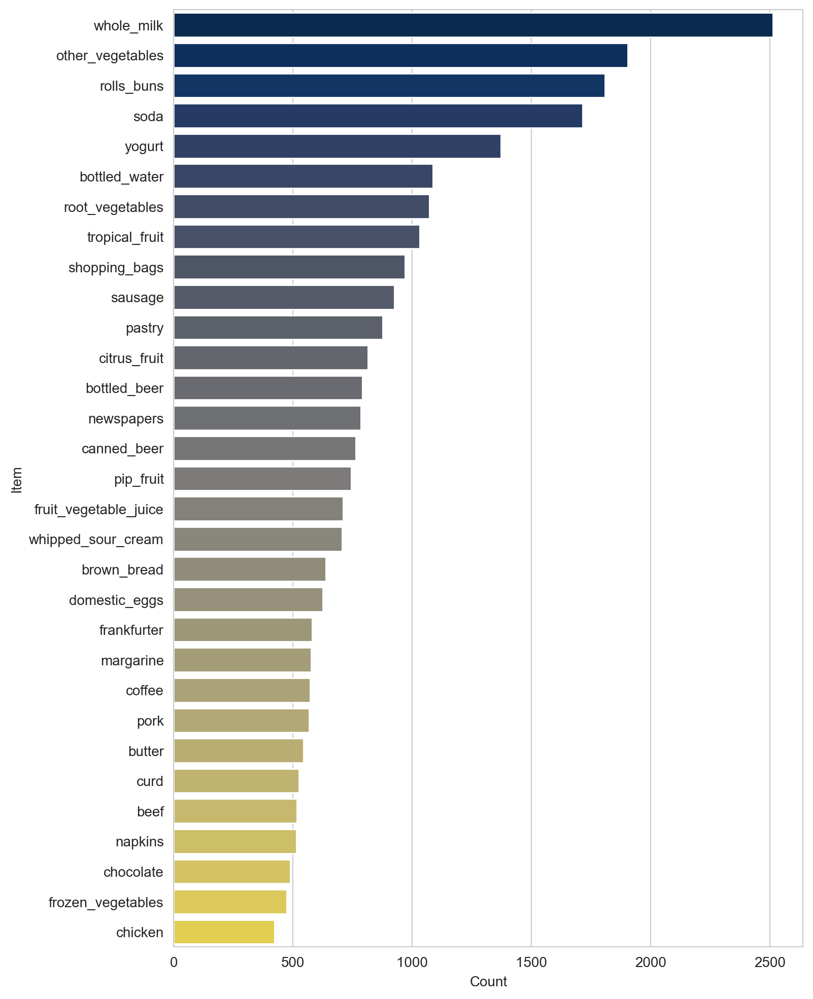

In [29]:
df_plot = pd.DataFrame(pd.Series(text).value_counts()).reset_index()
df_plot.columns = ['Item','Count']
sns.set_style('whitegrid')
plt.figure(figsize=(8,12))
sns.barplot(y='Item', x='Count', data=df_plot[:31], palette='cividis');

There are 43,367 items


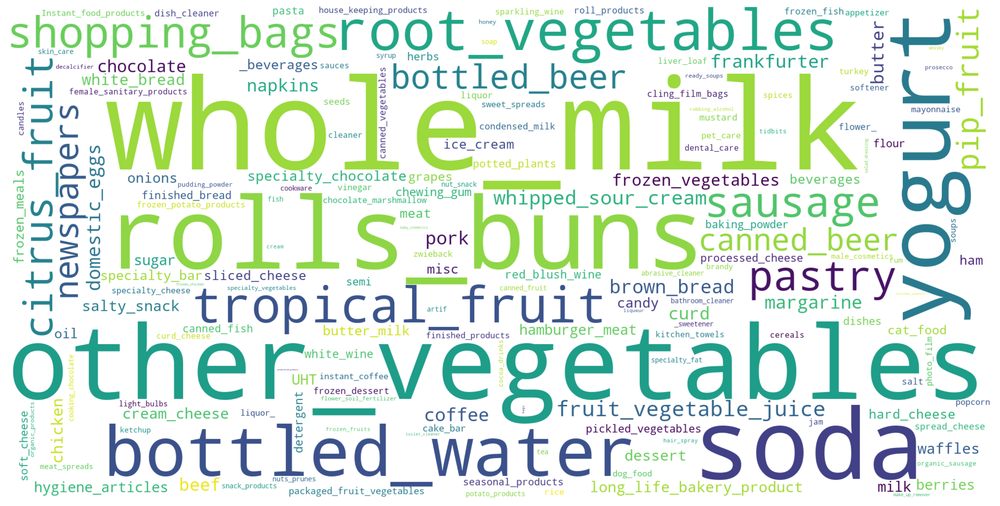

In [30]:
nr_words = '{:,}'.format(len(text))
print ("There are",nr_words,"items",)

wordcloud = WordCloud( background_color="white",width=2000, height=1000,max_words=500,collocations=False).generate(" ".join(text))
plt.figure(figsize=[20,20])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [33]:
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE
!pip install adjustText
from adjustText import adjust_text

In [34]:
sentences = []
for i, row in df.iterrows():
    vals = row.values[1:].astype(str)
    
    # Remove the nans
    vals = vals[vals != 'nan']
    
    # Order does not really matter in shopping baskets (unlike English sentences)
    # so this is a form of augmentation
    for _ in range(min(3, len(vals))):
        np.random.shuffle(vals)
        sentences.append(list(vals))
        
print('\n'.join([', '.join(x) for x in sentences[:10]]))

semi-finished bread, ready soups, margarine
margarine, ready soups, semi-finished bread
ready soups, margarine, semi-finished bread
coffee, yogurt
coffee, yogurt
yogurt, meat spreads, cream cheese
cream cheese, yogurt, meat spreads
cream cheese, yogurt, meat spreads
whole milk, long life bakery product, condensed milk
condensed milk, long life bakery product, whole milk


In [35]:
print('Embedding {} sentences...'.format(len(sentences)))
    
model = Word2Vec(
    sentences,
    # size=10,
    window=3,
    workers=1,
    sg=0,
    # iter=25,
    negative=25,
    min_count=1,
    seed=42,
    compute_loss=True
)

print(model.get_latest_training_loss())

Embedding 18443 sentences...
1228590.0


168 (168, 100)


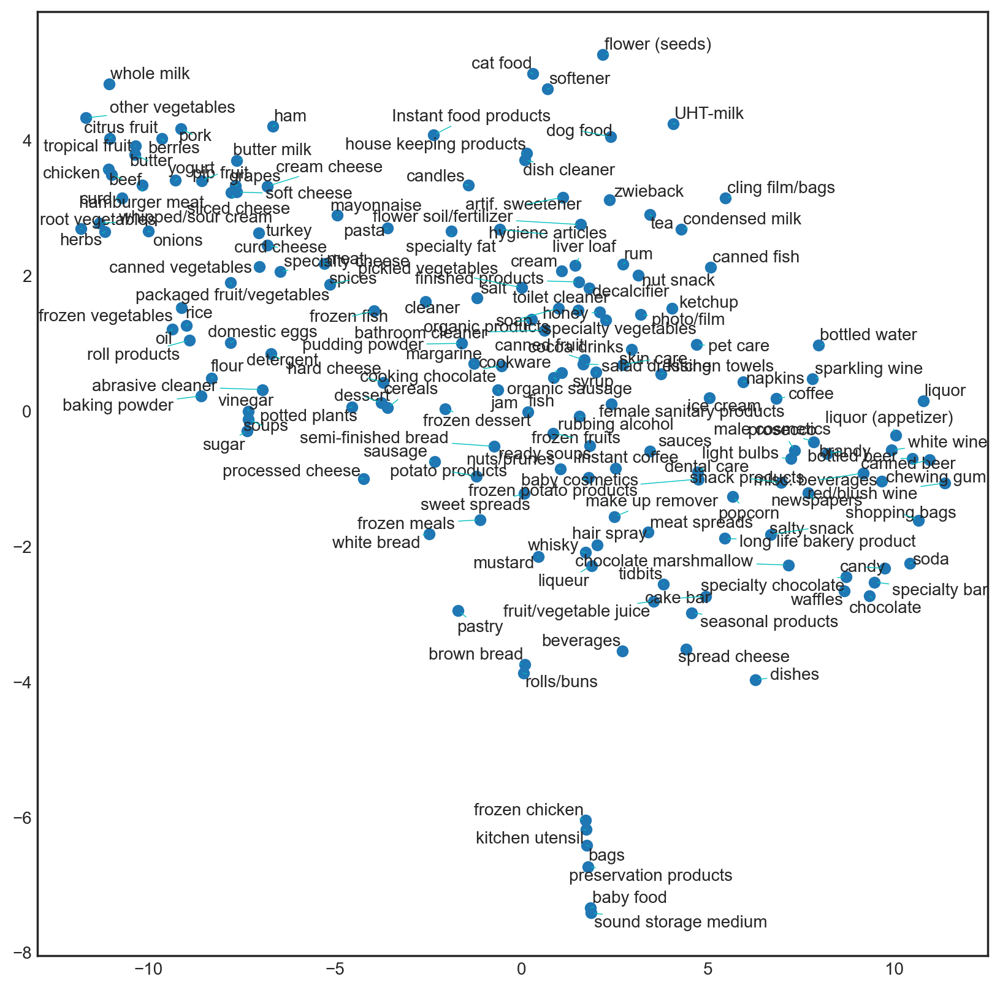

In [37]:
plt.style.use('seaborn-white')
plt.rcParams['figure.figsize']=8,8 
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 10
plt.rcParams['lines.linewidth'] = 3
# plt.rcParams['axes.labelsize']=20
# plt.rcParams['xtick.labelsize']=16
# plt.rcParams['ytick.labelsize']=16
# plt.rcParams['legend.fontsize']=16

products = list(model.wv.index_to_key)
embeddings = []
for product in products:
    embeddings.append(model.wv[product])
embeddings = np.array(embeddings)
print(len(products), embeddings.shape)

tsne = TSNE(random_state=42)
X_tsne = tsne.fit_transform(embeddings)

plt.figure(figsize=(10, 10))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1])

texts = []
for x, y, lab in zip(X_tsne[:, 0], X_tsne[:, 1], products):
    text = plt.text(x, y, lab)
    texts.append(text)
    
adjust_text(texts, lim=5, arrowprops=dict(arrowstyle="-", color='c', lw=0.5))
plt.show()

In [38]:
transactions = df.values.astype(str).tolist()
transactions = [[item for item in row if item != 'nan'] for row in transactions]
transactions[:5]

[['citrus fruit', 'semi-finished bread', 'margarine', 'ready soups'],
 ['tropical fruit', 'yogurt', 'coffee'],
 ['whole milk'],
 ['pip fruit', 'yogurt', 'cream cheese', 'meat spreads'],
 ['other vegetables',
  'whole milk',
  'condensed milk',
  'long life bakery product']]

In [39]:
te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
df = pd.DataFrame(te_ary, columns=te.columns_)

In [40]:
df.head(5)

,Instant food products,UHT-milk,abrasive cleaner,artif. sweetener,baby cosmetics,baby food,bags,baking powder,bathroom cleaner,beef,berries,beverages,bottled beer,bottled water,brandy,brown bread,butter,butter milk,cake bar,candles,candy,canned beer,canned fish,canned fruit,canned vegetables,cat food,cereals,chewing gum,chicken,chocolate,chocolate marshmallow,citrus fruit,cleaner,cling film/bags,cocoa drinks,coffee,condensed milk,cooking chocolate,cookware,cream,cream cheese,curd,curd cheese,decalcifier,dental care,dessert,detergent,dish cleaner,dishes,dog food,domestic eggs,female sanitary products,finished products,fish,flour,flower (seeds),flower soil/fertilizer,frankfurter,frozen chicken,frozen dessert,frozen fish,frozen fruits,frozen meals,frozen potato products,frozen vegetables,fruit/vegetable juice,grapes,hair spray,ham,hamburger meat,hard cheese,herbs,honey,house keeping products,hygiene articles,ice cream,instant coffee,jam,ketchup,kitchen towels,kitchen utensil,light bulbs,liqueur,liquor,liquor (appetizer),liver loaf,long life bakery product,make up remover,male cosmetics,margarine,mayonnaise,meat,meat spreads,misc. beverages,mustard,napkins,newspapers,nut snack,nuts/prunes,oil,onions,organic products,organic sausage,other vegetables,packaged fruit/vegetables,pasta,pastry,pet care,photo/film,pickled vegetables,pip fruit,popcorn,pork,potato products,potted plants,preservation products,processed cheese,prosecco,pudding powder,ready soups,red/blush wine,rice,roll products,rolls/buns,root vegetables,rubbing alcohol,rum,salad dressing,salt,salty snack,sauces,sausage,seasonal products,semi-finished bread,shopping bags,skin care,sliced cheese,snack products,soap,soda,soft cheese,softener,sound storage medium,soups,sparkling wine,specialty bar,specialty cheese,specialty chocolate,specialty fat,specialty vegetables,spices,spread cheese,sugar,sweet spreads,syrup,tea,tidbits,toilet cleaner,tropical fruit,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Tr

In [41]:
df.to_csv(r"C:\Users\j_n_x\groceriesT.csv", index=False)

In [42]:
df.to_csv(r"C:\Users\j_n_x\groceriesTa.csv")

In [43]:
df.shape

(9835, 169)

In [44]:
frequent_itemsets = apriori(df, min_support=0.01, use_colnames=True)

In [45]:
frequent_itemsets.count()['itemsets']

333

In [46]:
frequent_itemsets.nlargest(n = 20, columns = 'support')

,support,itemsets
86,0.255516,(whole milk)
55,0.193493,(other vegetables)
66,0.183935,(rolls/buns)
75,0.174377,(soda)
87,0.139502,(yogurt)
6,0.110524,(bottled water)
67,0.108998,(root vegetables)
81,0.104931,(tropical fruit)
73,0.098526,(shopping bags)
70,0.093950,(sausage)


<AxesSubplot: xlabel='support', ylabel='itemsets'>

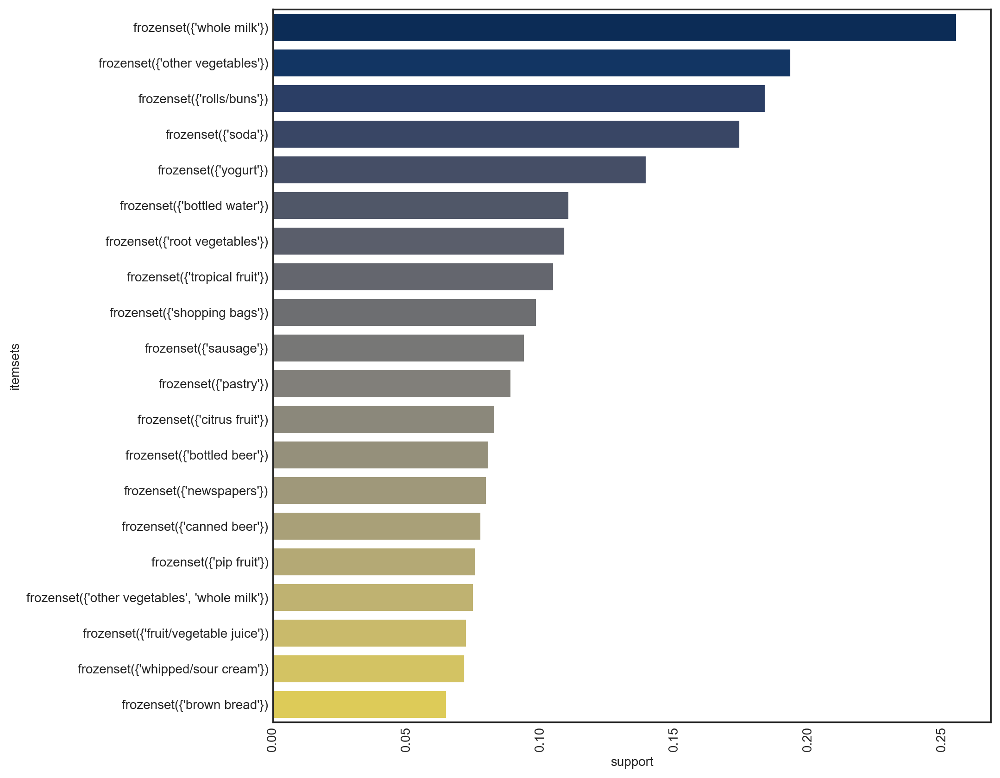

In [47]:
plt.figure(figsize=(10,10))
plt.xticks(rotation=90)
sns.barplot(y='itemsets', x='support', data=frequent_itemsets.nlargest(n = 20, columns = 'support'),palette='cividis')

In [48]:
rules_plot_lift = []
for conf in np.linspace(0,4,20):
    rules = association_rules(frequent_itemsets, metric="lift", min_threshold=conf)
    rules_plot_lift.append(len(rules))

Text(0, 0.5, 'nr of rules')

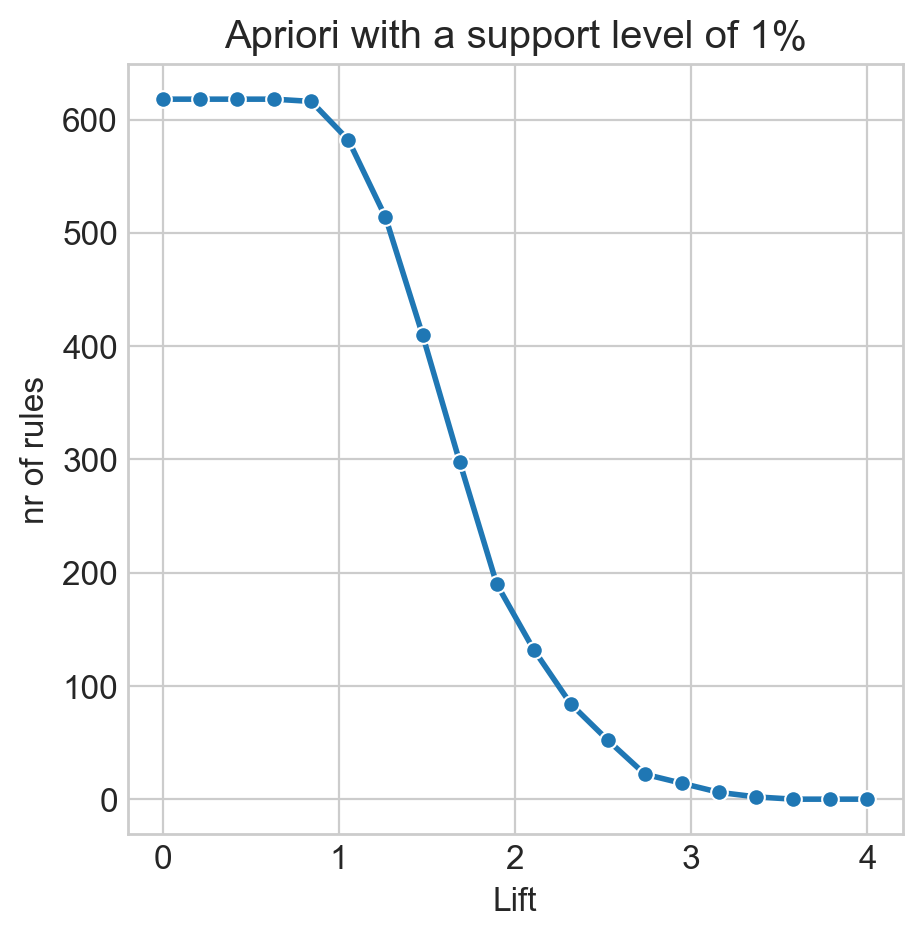

In [49]:
plt.style.use('seaborn-whitegrid')
plt.rcParams['figure.figsize']=5,5 
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 12
plt.rcParams['lines.linewidth'] = 2
sns.lineplot(x=np.linspace(0,4,20),
             y=rules_plot_lift,
             # style="logic",
             marker='o')
plt.title("Apriori with a support level of 1%")
plt.xlabel('Lift')
plt.ylabel('nr of rules')
# sns.despine()

In [50]:
rules_plot_conf = []
for conf in np.linspace(0,1,20):
    rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=conf)
    rules_plot_conf.append(len(rules))

Text(0, 0.5, 'nr of rules')

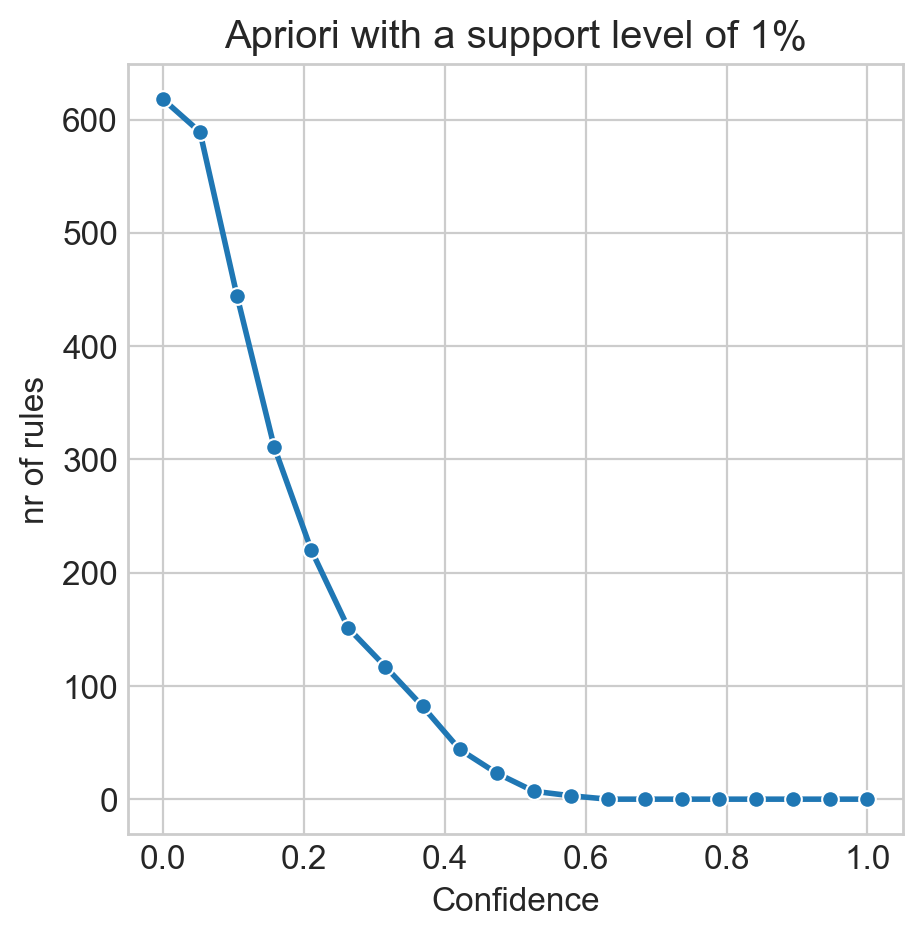

In [51]:
plt.style.use('seaborn-whitegrid')
plt.rcParams['figure.figsize']=5,5 
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 12
plt.rcParams['lines.linewidth'] = 2
sns.lineplot(x=np.linspace(0,1,20),
             y=rules_plot_conf,
             # style="logic",
             marker='o')
plt.title("Apriori with a support level of 1%")
plt.xlabel('Confidence')
plt.ylabel('nr of rules')
# sns.despine()

In [52]:
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.40)
# Lift measures how likely an item is purchased when another item is purchased, while controlling for how popular both items are.
# A lift of 1 will then mean that both of the items are actually independent and without any association.
# For any value higher than 1, lift shows that there is actually an association. 
# The higher the value, the higher the association.
# rules = rules[rules['confidence']<0.3]
rules.sort_values(by=['confidence'], ascending=False).head(100)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
28,"(root vegetables, citrus fruit)",(other vegetables),0.017692,0.193493,0.010371,0.586207,3.029608,0.006948,1.949059
43,"(root vegetables, tropical fruit)",(other vegetables),0.021047,0.193493,0.012303,0.584541,3.020999,0.008231,1.941244
32,"(yogurt, curd)",(whole milk),0.017285,0.255516,0.010066,0.582353,2.279125,0.005649,1.782567
26,"(butter, other vegetables)",(whole milk),0.020031,0.255516,0.011490,0.573604,2.244885,0.006371,1.745992
58,"(root vegetables, tropical fruit)",(whole milk),0.021047,0.255516,0.011998,0.570048,2.230969,0.006620,1.731553
59,"(root vegetables, yogurt)",(whole milk),0.025826,0.255516,0.014540,0.562992,2.203354,0.007941,1.703594
33,"(other vegetables, domestic eggs)",(whole milk),0.022267,0.255516,0.012303,0.552511,2.162336,0.006613,1.663694
61,"(whipped/sour cream, yogurt)",(whole milk),0.020742,0.255516,0.010880,0.524510,2.052747,0.005580,1.565719
55,"(root vegetables, rolls/buns)",(whole milk),0.024301,0.255516,0.012710,0.523013,2.046888,0.006500,1.560804
37,"(other vegetables, pip fruit)",(whole milk),0.026131,0.255516,0.013523,0.517510,2.025351,0.006846,1.543003


In [53]:
rules.shape

(62, 9)

In [54]:
rules["antecedent_len"] = rules["antecedents"].apply(lambda x: len(x))
rules["consequent_len"] = rules["consequents"].apply(lambda x: len(x))
rules['rule'] = rules.index
rules.drop(['antecedent support','consequent support','conviction','antecedent_len','consequent_len'],axis=1).sort_values(by=['confidence'], ascending=False).head(100)

,antecedents,consequents,support,confidence,lift,leverage,rule
28,"(root vegetables, citrus fruit)",(other vegetables),0.010371,0.586207,3.029608,0.006948,28
43,"(root vegetables, tropical fruit)",(other vegetables),0.012303,0.584541,3.020999,0.008231,43
32,"(yogurt, curd)",(whole milk),0.010066,0.582353,2.279125,0.005649,32
26,"(butter, other vegetables)",(whole milk),0.011490,0.573604,2.244885,0.006371,26
58,"(root vegetables, tropical fruit)",(whole milk),0.011998,0.570048,2.230969,0.006620,58
59,"(root vegetables, yogurt)",(whole milk),0.014540,0.562992,2.203354,0.007941,59
33,"(other vegetables, domestic eggs)",(whole milk),0.012303,0.552511,2.162336,0.006613,33
61,"(whipped/sour cream, yogurt)",(whole milk),0.010880,0.524510,2.052747,0.005580,61
55,"(root vegetables, rolls/buns)",(whole milk),0.012710,0.523013,2.046888,0.006500,55
37,"(other vegetables, pip fruit)",(whole milk),0.013523,0.517510,2.025351,0.006846,37


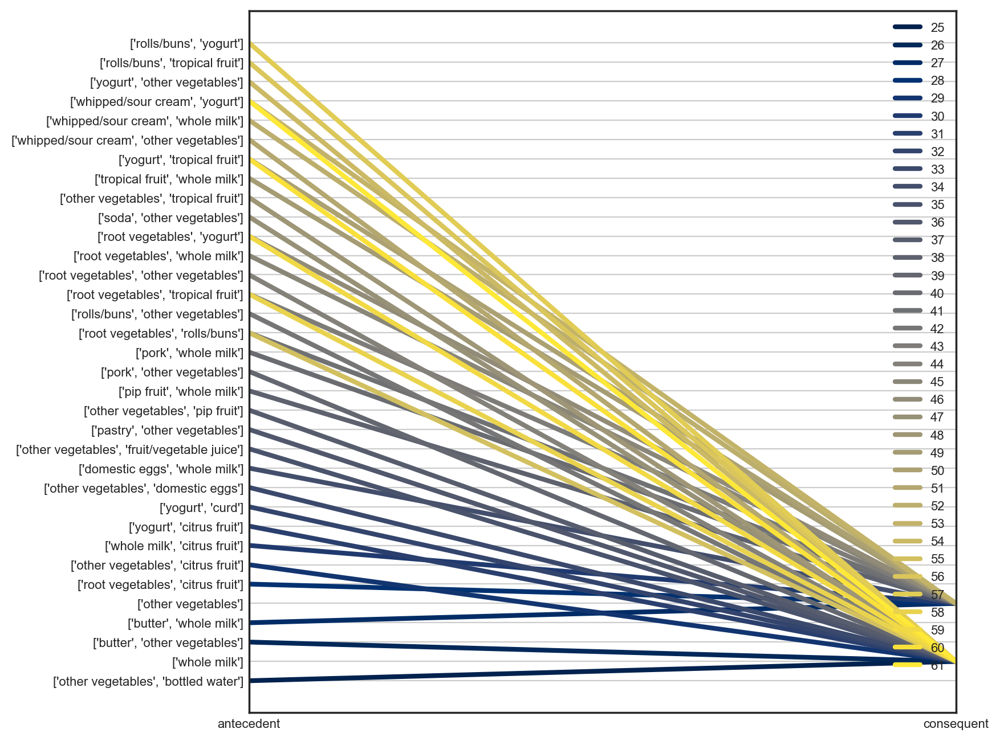

In [55]:
plt.style.use('seaborn-white')
plt.rcParams['figure.figsize']=8,8 
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 8
plt.rcParams['lines.linewidth'] = 3

from pandas.plotting import parallel_coordinates
rules['antecedent'] = rules['antecedents'].apply(lambda antecedent: str(list(antecedent)))
rules['consequent'] = rules['consequents'].apply(lambda consequent: str(list(consequent)))
coords = rules[['antecedent','consequent','rule']][rules['antecedent_len']>1]

parallel_coordinates(coords,'rule', colormap = 'cividis')
plt.show()

In [56]:
rules.drop(['antecedent support','consequent support','conviction','antecedent_len','consequent_len'],axis=1)[rules['antecedent_len'] >= 2].head(20)

,antecedents,consequents,support,confidence,lift,leverage,rule,antecedent,consequent
25,"(other vegetables, bottled water)",(whole milk),0.010778,0.434426,1.700192,0.004439,25,"['other vegetables', 'bottled water']",['whole milk']
26,"(butter, other vegetables)",(whole milk),0.011490,0.573604,2.244885,0.006371,26,"['butter', 'other vegetables']",['whole milk']
27,"(butter, whole milk)",(other vegetables),0.011490,0.416974,2.154987,0.006158,27,"['butter', 'whole milk']",['other vegetables']
28,"(root vegetables, citrus fruit)",(other vegetables),0.010371,0.586207,3.029608,0.006948,28,"['root vegetables', 'citrus fruit']",['other vegetables']
29,"(other vegetables, citrus fruit)",(whole milk),0.013015,0.450704,1.763898,0.005636,29,"['other vegetables', 'citrus fruit']",['whole milk']
30,"(whole milk, citrus fruit)",(other vegetables),0.013015,0.426667,2.205080,0.007113,30,"['whole milk', 'citrus fruit']",['other vegetables']
31,"(yogurt, citrus fruit)",(whole milk),0.010269,0.474178,1.855768,0.004736,31,"['yogurt', 'citrus fruit']",['whole milk']
32,"(yogurt, curd)",(whole milk),0.010066,0.582353,2.279125,0.005649,32,"['yogurt', 'curd']",['whole milk']
33,"(other vegetables, domestic eggs)",(whole milk),0.012303,0.552511,2.162336,0.006613,33,"['other vegetables', 'domestic eggs']",['whole milk']
34,"(domestic eggs, whole milk)",(other vegetables),0.012303,0.410169,2.119820,0.006499,34,"['domestic eggs', 'whole milk']",['other vegetables']


<Figure size 1000x1000 with 0 Axes>

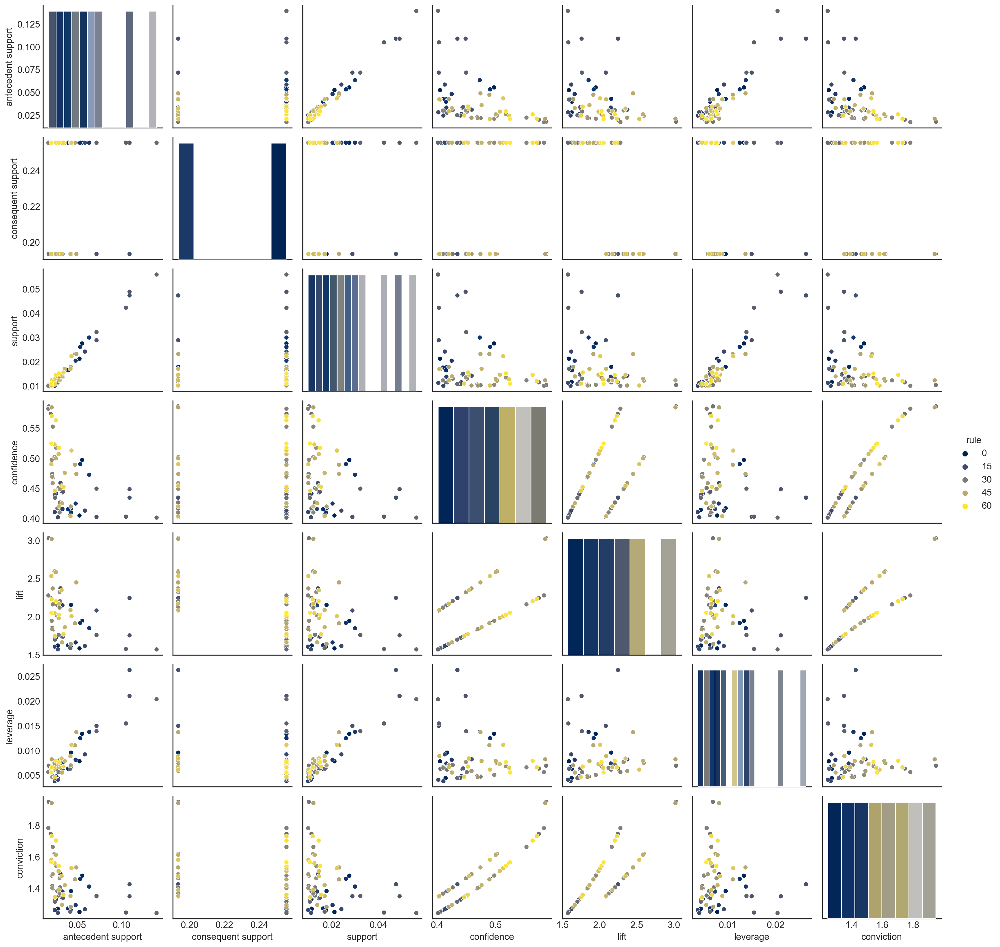

<Figure size 800x800 with 0 Axes>

In [57]:
plt.style.use('seaborn-white')
plt.rcParams['figure.figsize']=8,8 
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 12
plt.rcParams['lines.linewidth'] = 3

plt.figure(figsize=(10,10))
sns.set_style('white')
plot_kws={"s": 1}
g = sns.pairplot(
             rules.drop(['antecedent_len','consequent_len'],axis=1),
             # kind='reg',
             diag_kind='hist',
             corner=False,
             # plot_kws=dict(scatter_kws=dict(s=5)),
             palette='cividis',
             hue='rule'
            )

# g = g.map_diag(sns.kdeplot, lw=2)
# g = g.map_offdiag(sns.kdeplot, lw=0.5)
plt.show()
sns.despine()

In [58]:
import networkx as nx
rules.sort_values(['confidence']).head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,antecedent_len,consequent_len,rule,antecedent,consequent
24,(yogurt),(whole milk),0.139502,0.255516,0.056024,0.401603,1.571735,0.020379,1.244132,1,1,24,['yogurt'],['whole milk']
14,(oil),(whole milk),0.028063,0.255516,0.011286,0.402174,1.573968,0.004116,1.245319,1,1,14,['oil'],['whole milk']
17,(whipped/sour cream),(other vegetables),0.071683,0.193493,0.028876,0.402837,2.081924,0.015006,1.350565,1,1,17,['whipped/sour cream'],['other vegetables']
21,(tropical fruit),(whole milk),0.104931,0.255516,0.042298,0.403101,1.577595,0.015486,1.247252,1,1,21,['tropical fruit'],['whole milk']
49,"(tropical fruit, whole milk)",(other vegetables),0.042298,0.193493,0.017082,0.403846,2.087140,0.008898,1.352851,2,1,49,"['tropical fruit', 'whole milk']",['other vegetables']


In [59]:
G = nx.from_pandas_edgelist(rules,
                            source='antecedent',
                            target='consequent',
                            edge_attr='confidence'
                            # edge_attr=True
                           )

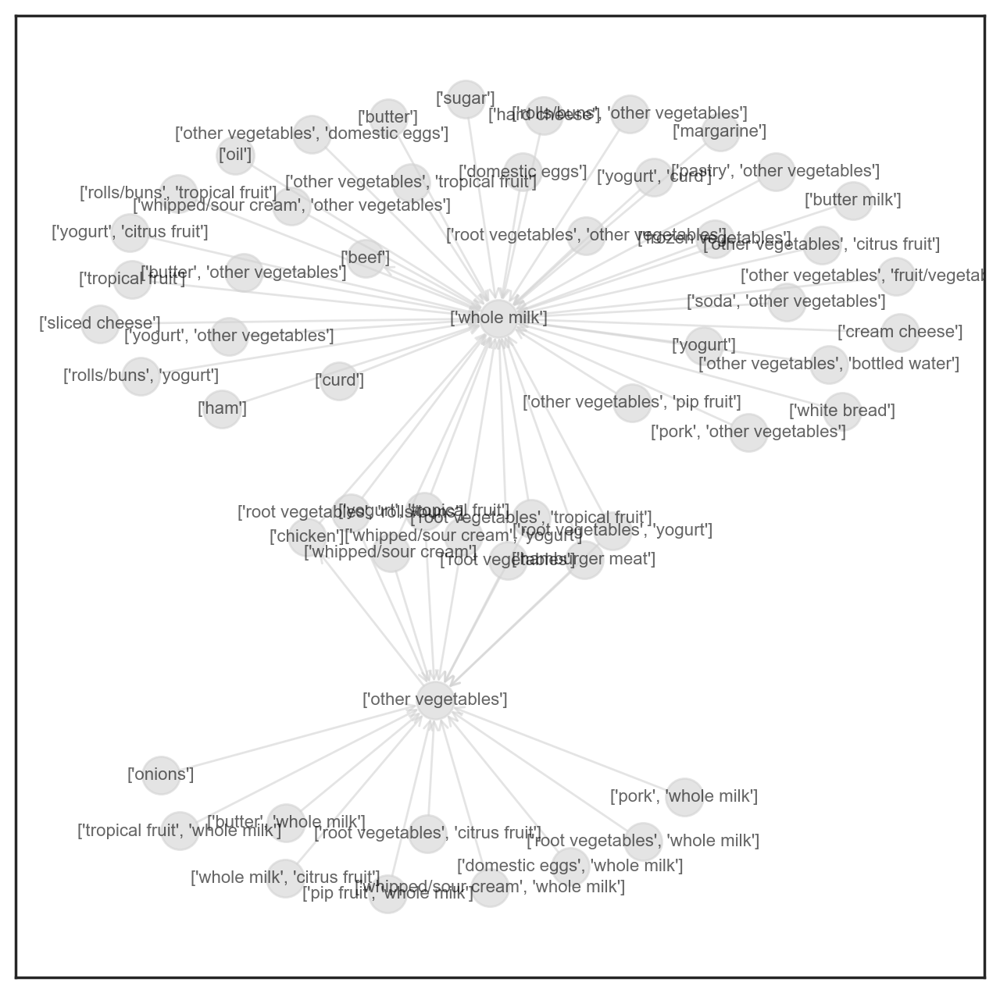

In [60]:
nx.draw_networkx(G,
                 arrows=True,
                 arrowstyle='<-',
                 with_labels=True,
                 cmap='cividis',
                 alpha=0.6,
                 edge_color='lightgray',
                 font_size=8,
                 node_color='lightgrey'
                 # node_color=rules['support'].iloc[:47]
                )

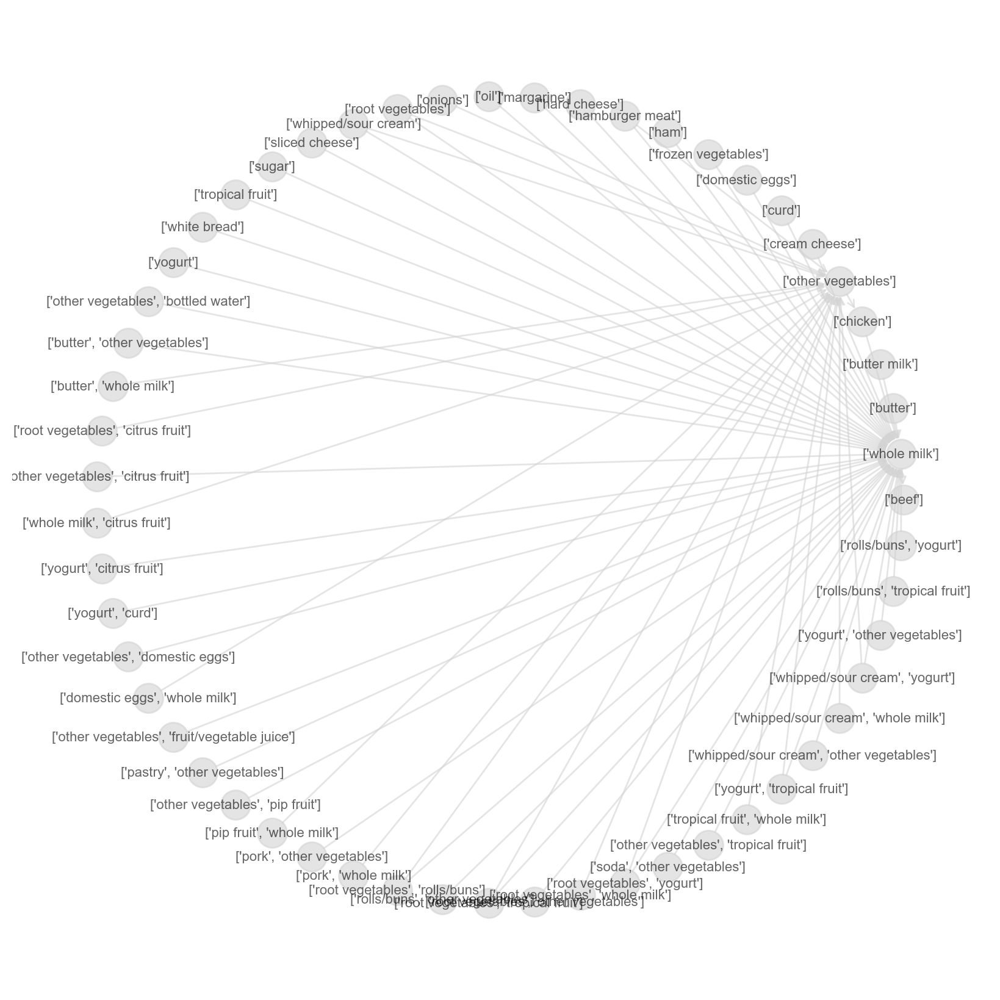

In [61]:
nx.draw_circular(G,
                 arrows=True,
                 arrowstyle='<-',
                 with_labels=True,
                 cmap='cividis',
                 alpha=0.6,
                 edge_color='lightgray',
                 font_size=8,
                 node_color='lightgrey'
                 # node_color=rules.sort_values(['support'])['support'].iloc[:47]
                )

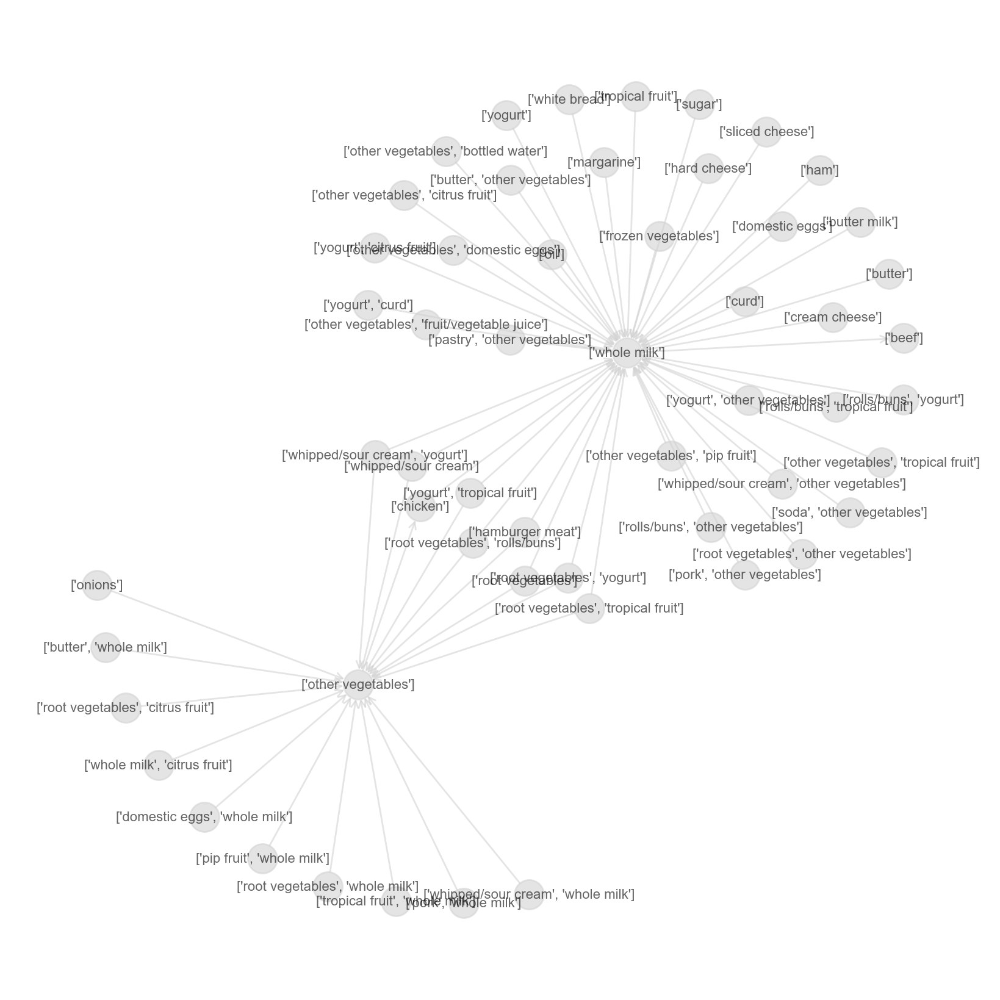

In [62]:
plt.rcParams['figure.figsize']=8,8
nx.draw_kamada_kawai(G,
                 arrows=True,
                 arrowstyle='<-',
                 with_labels=True,
                 cmap='cividis',
                 alpha=0.6,
                 edge_color='lightgray',
                 font_size=8,
                 node_color='lightgrey',
                )

In [64]:
'''
    Created by Nurbek Juraev
'''

import pandas as pd
import matplotlib.pyplot as plt

def catscatter(df,colx,coly,cols,color=['grey','black'],ratio=10,font='Helvetica',save=False,save_name='Default'):
    '''
    Goal: This function create an scatter plot for categorical variables. It's useful to compare two lists with elements in common.
    Input:
        - df: required. pandas DataFrame with at least two columns with categorical variables you want to relate, and the value of both (if it's just an adjacent matrix write 1)
        - colx: required. The name of the column to display horizontaly
        - coly: required. The name of the column to display vertically
        - cols: required. The name of the column with the value between the two variables
        - color: optional. Colors to display in the visualization, the length can be two or three. The two first are the colors for the lines in the matrix, the last one the font color and markers color.
            default ['grey','black']
        - ratio: optional. A ratio for controlling the relative size of the markers.
            default 10
        - font: optional. The font for the ticks on the matrix.
            default 'Helvetica'
        - save: optional. True for saving as an image in the same path as the code.
            default False
        - save_name: optional. The name used for saving the image (then the code ads .png)
            default: "Default"
    Output:
        No output. Matplotlib object is not shown by default to be able to add more changes.
    '''
    # Create a dict to encode the categeories into numbers (sorted)
    colx_codes=dict(zip(df[colx].sort_values().unique(),range(len(df[colx].unique()))))
    coly_codes=dict(zip(df[coly].sort_values(ascending=False).unique(),range(len(df[coly].unique()))))
    
    # Apply the encoding
    df[colx]=df[colx].apply(lambda x: colx_codes[x])
    df[coly]=df[coly].apply(lambda x: coly_codes[x])
    
    
    # Prepare the aspect of the plot
    plt.rcParams['figure.figsize']=10,3 
    plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
    plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True
    plt.rcParams['font.sans-serif']=font
    plt.rcParams['xtick.color']='darkslategrey'
    plt.rcParams['ytick.color']='darkslategrey'
    plt.box(False)

    
    # Plot all the lines for the background
    for num in range(len(coly_codes)):
        plt.hlines(num,-1,len(colx_codes)+1,linewidth=0.5,color='lightgray',alpha=0.8)
    for num in range(len(colx_codes)):
        plt.vlines(num,-1,len(coly_codes)+1,linewidth=0.5,color='lightgray',alpha=0.8)
        
    # Plot the scatter plot with the numbers
    plt.scatter(df[colx],
               df[coly],
               s=df[cols]*ratio,
               zorder=2,
               color='gray')
    
    # Change the ticks numbers to categories and limit them
    plt.xticks(ticks=list(colx_codes.values()),labels=colx_codes.keys(),rotation=90)
    plt.yticks(ticks=list(coly_codes.values()),labels=coly_codes.keys())
    plt.xlim(xmin=-1,xmax=len(colx_codes))
    plt.ylim(ymin=-1,ymax=len(coly_codes))

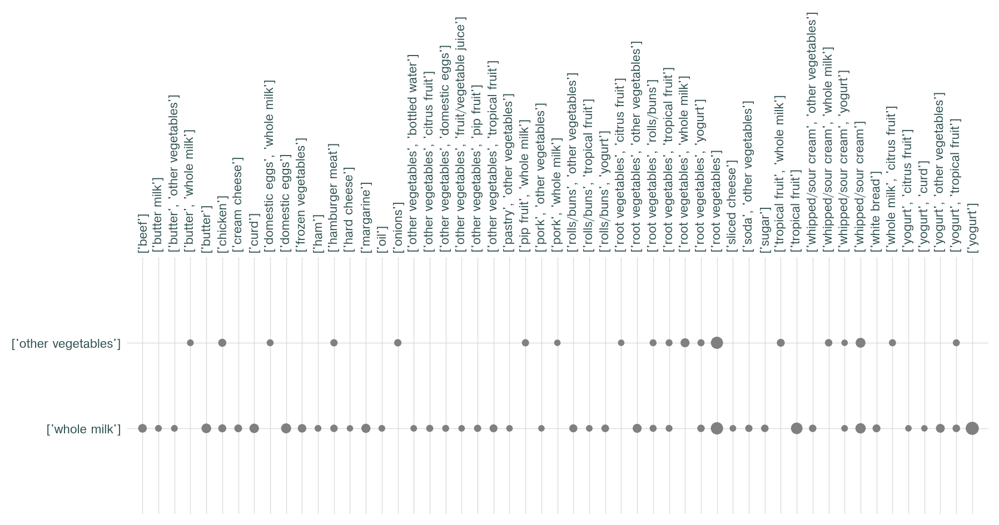

In [65]:
# catscatter(rules,'antecedent','consequent','support')

kcolors=['#F73972','#F2B3C6','#144962']
# create the plot
catscatter(rules,'antecedent','consequent','support',color=kcolors, ratio=1000)
rules['antecedent'] = rules['antecedents'].apply(lambda antecedent: str(list(antecedent)))
rules['consequent'] = rules['consequents'].apply(lambda consequent: str(list(consequent)))
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

In [66]:
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=2.40)
# Lift measures how likely an item is purchased when another item is purchased, while controlling for how popular both items are.
# A lift of 1 will then mean that both of the items are actually independent and without any association.
# For any value higher than 1, lift shows that there is actually an association. 
# The higher the value, the higher the association.
# rules = rules[rules['confidence']<0.3]
rules.sort_values(by=['confidence'], ascending=False).head(100)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
11,"(root vegetables, citrus fruit)",(other vegetables),0.017692,0.193493,0.010371,0.586207,3.029608,0.006948,1.949059
29,"(root vegetables, tropical fruit)",(other vegetables),0.021047,0.193493,0.012303,0.584541,3.020999,0.008231,1.941244
24,"(root vegetables, rolls/buns)",(other vegetables),0.024301,0.193493,0.012201,0.502092,2.594890,0.007499,1.619792
38,"(root vegetables, yogurt)",(other vegetables),0.025826,0.193493,0.012913,0.500000,2.584078,0.007916,1.613015
48,"(whipped/sour cream, yogurt)",(other vegetables),0.020742,0.193493,0.010168,0.490196,2.533410,0.006154,1.581995
34,"(root vegetables, whole milk)",(other vegetables),0.048907,0.193493,0.023183,0.474012,2.449770,0.013719,1.533320
19,"(curd, whole milk)",(yogurt),0.026131,0.139502,0.010066,0.385214,2.761356,0.006421,1.399671
12,"(other vegetables, citrus fruit)",(root vegetables),0.028876,0.108998,0.010371,0.359155,3.295045,0.007224,1.390354
57,"(tropical fruit, whole milk)",(yogurt),0.042298,0.139502,0.015150,0.358173,2.567516,0.009249,1.340701
49,"(whipped/sour cream, other vegetables)",(yogurt),0.028876,0.139502,0.010168,0.352113,2.524073,0.006139,1.328160


In [67]:
rules.shape

(64, 9)

In [68]:
rules["antecedent_len"] = rules["antecedents"].apply(lambda x: len(x))
rules["consequent_len"] = rules["consequents"].apply(lambda x: len(x))
rules['rule'] = rules.index
rules.drop(['antecedent support','consequent support','conviction','antecedent_len','consequent_len'],axis=1).sort_values(by=['confidence'], ascending=False).head(100)

,antecedents,consequents,support,confidence,lift,leverage,rule
11,"(root vegetables, citrus fruit)",(other vegetables),0.010371,0.586207,3.029608,0.006948,11
29,"(root vegetables, tropical fruit)",(other vegetables),0.012303,0.584541,3.020999,0.008231,29
24,"(root vegetables, rolls/buns)",(other vegetables),0.012201,0.502092,2.594890,0.007499,24
38,"(root vegetables, yogurt)",(other vegetables),0.012913,0.500000,2.584078,0.007916,38
48,"(whipped/sour cream, yogurt)",(other vegetables),0.010168,0.490196,2.533410,0.006154,48
34,"(root vegetables, whole milk)",(other vegetables),0.023183,0.474012,2.449770,0.013719,34
19,"(curd, whole milk)",(yogurt),0.010066,0.385214,2.761356,0.006421,19
12,"(other vegetables, citrus fruit)",(root vegetables),0.010371,0.359155,3.295045,0.007224,12
57,"(tropical fruit, whole milk)",(yogurt),0.015150,0.358173,2.567516,0.009249,57
49,"(whipped/sour cream, other vegetables)",(yogurt),0.010168,0.352113,2.524073,0.006139,49


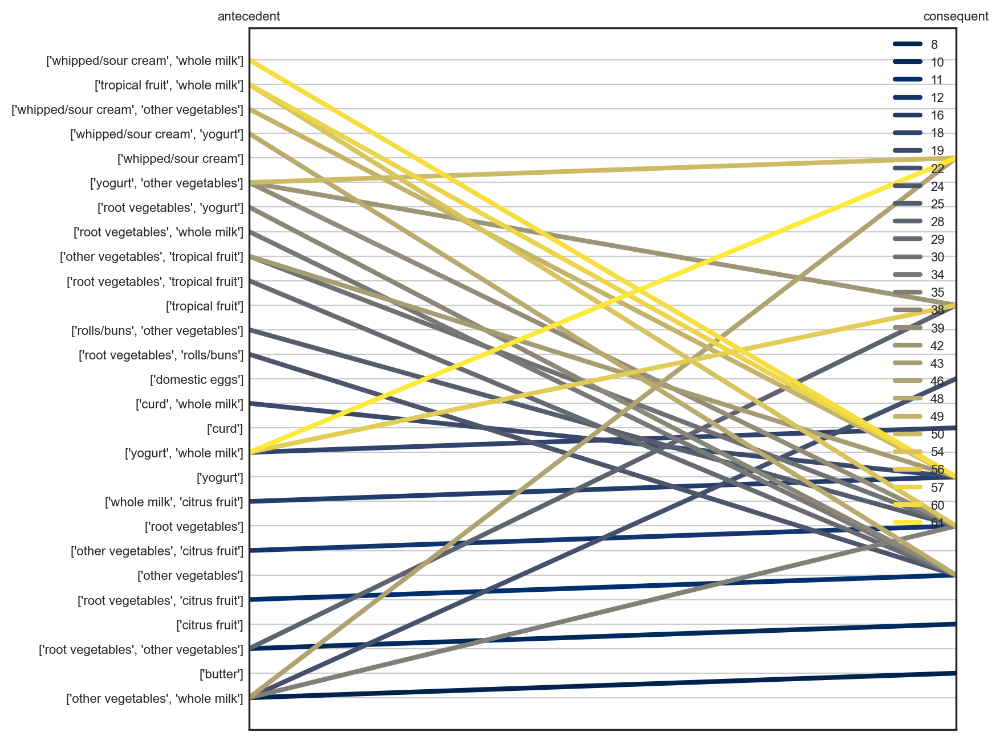

In [69]:
plt.style.use('seaborn-white')
plt.rcParams['figure.figsize']=8,8 
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 8
plt.rcParams['lines.linewidth'] = 3

from pandas.plotting import parallel_coordinates
rules['antecedent'] = rules['antecedents'].apply(lambda antecedent: str(list(antecedent)))
rules['consequent'] = rules['consequents'].apply(lambda consequent: str(list(consequent)))
coords = rules[['antecedent','consequent','rule']][rules['antecedent_len']>1]

parallel_coordinates(coords,'rule', colormap = 'cividis')
plt.show()

In [70]:
rules.drop(['antecedent support','consequent support','conviction','antecedent_len','consequent_len'],axis=1)[rules['antecedent_len'] >= 2].head(20)

,antecedents,consequents,support,confidence,lift,leverage,rule,antecedent,consequent
8,"(other vegetables, whole milk)",(butter),0.011490,0.153533,2.770630,0.007343,8,"['other vegetables', 'whole milk']",['butter']
10,"(root vegetables, other vegetables)",(citrus fruit),0.010371,0.218884,2.644626,0.006450,10,"['root vegetables', 'other vegetables']",['citrus fruit']
11,"(root vegetables, citrus fruit)",(other vegetables),0.010371,0.586207,3.029608,0.006948,11,"['root vegetables', 'citrus fruit']",['other vegetables']
12,"(other vegetables, citrus fruit)",(root vegetables),0.010371,0.359155,3.295045,0.007224,12,"['other vegetables', 'citrus fruit']",['root vegetables']
16,"(whole milk, citrus fruit)",(yogurt),0.010269,0.336667,2.413350,0.006014,16,"['whole milk', 'citrus fruit']",['yogurt']
18,"(yogurt, whole milk)",(curd),0.010066,0.179673,3.372304,0.007081,18,"['yogurt', 'whole milk']",['curd']
19,"(curd, whole milk)",(yogurt),0.010066,0.385214,2.761356,0.006421,19,"['curd', 'whole milk']",['yogurt']
22,"(other vegetables, whole milk)",(domestic eggs),0.012303,0.164402,2.591178,0.007555,22,"['other vegetables', 'whole milk']",['domestic eggs']
24,"(root vegetables, rolls/buns)",(other vegetables),0.012201,0.502092,2.594890,0.007499,24,"['root vegetables', 'rolls/buns']",['other vegetables']
25,"(rolls/buns, other vegetables)",(root vegetables),0.012201,0.286396,2.627525,0.007558,25,"['rolls/buns', 'other vegetables']",['root vegetables']


<Figure size 1000x1000 with 0 Axes>

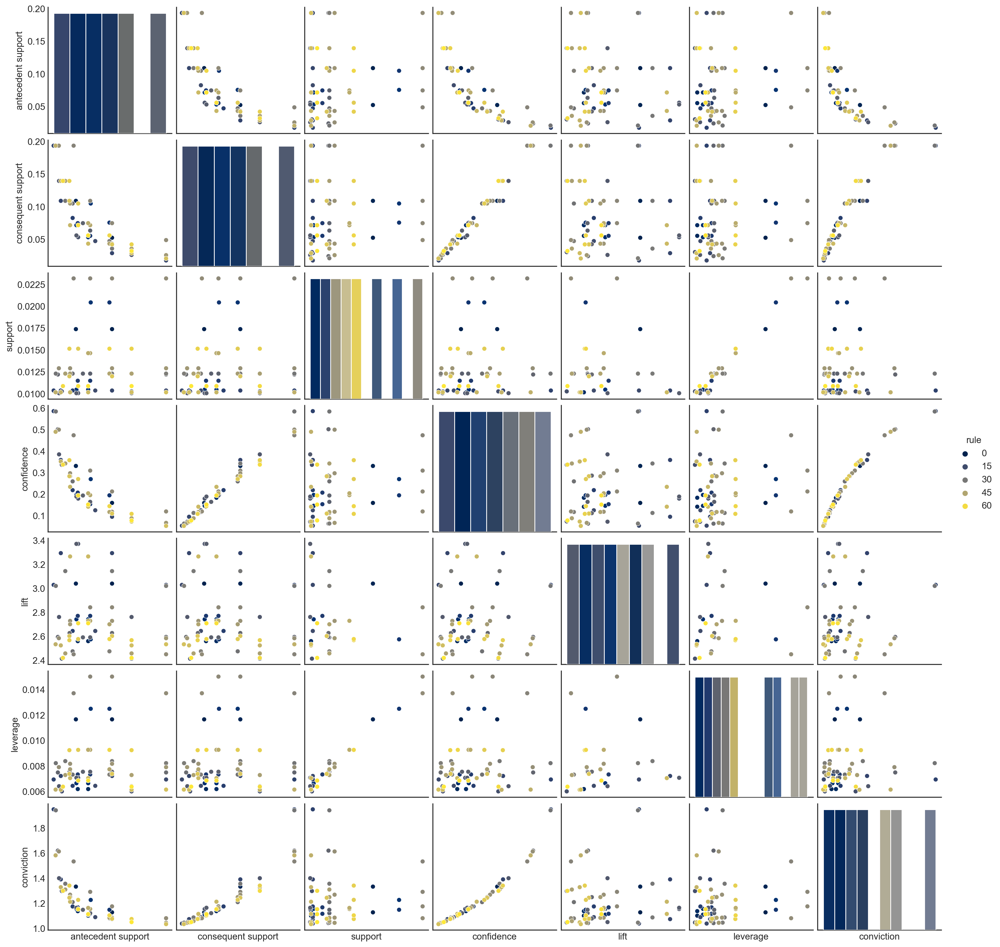

<Figure size 800x800 with 0 Axes>

In [71]:
plt.style.use('seaborn-white')
plt.rcParams['figure.figsize']=8,8 
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 12
plt.rcParams['lines.linewidth'] = 3

plt.figure(figsize=(10,10))
sns.set_style('white')
plot_kws={"s": 1}
g = sns.pairplot(
             rules.drop(['antecedent_len','consequent_len'],axis=1),
             # kind='reg',
             diag_kind='hist',
             corner=False,
             # plot_kws=dict(scatter_kws=dict(s=5)),
             palette='cividis',
             hue='rule'
            )

# g = g.map_diag(sns.kdeplot, lw=2)
# g = g.map_offdiag(sns.kdeplot, lw=0.5)
plt.show()
sns.despine()

In [72]:
import networkx as nx
rules.sort_values(['confidence']).head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,antecedent_len,consequent_len,rule,antecedent,consequent
53,(other vegetables),"(whipped/sour cream, yogurt)",0.193493,0.020742,0.010168,0.052549,2.533410,0.006154,1.033570,1,2,53,['other vegetables'],"['whipped/sour cream', 'yogurt']"
14,(other vegetables),"(root vegetables, citrus fruit)",0.193493,0.017692,0.010371,0.053600,3.029608,0.006948,1.037941,1,2,14,['other vegetables'],"['root vegetables', 'citrus fruit']"
27,(other vegetables),"(root vegetables, rolls/buns)",0.193493,0.024301,0.012201,0.063058,2.594890,0.007499,1.041366,1,2,27,['other vegetables'],"['root vegetables', 'rolls/buns']"
32,(other vegetables),"(root vegetables, tropical fruit)",0.193493,0.021047,0.012303,0.063584,3.020999,0.008231,1.045425,1,2,32,['other vegetables'],"['root vegetables', 'tropical fruit']"
41,(other vegetables),"(root vegetables, yogurt)",0.193493,0.025826,0.012913,0.066737,2.584078,0.007916,1.043836,1,2,41,['other vegetables'],"['root vegetables', 'yogurt']"


In [73]:
G = nx.from_pandas_edgelist(rules,
                            source='antecedent',
                            target='consequent',
                            edge_attr='confidence'
                            # edge_attr=True
                           )

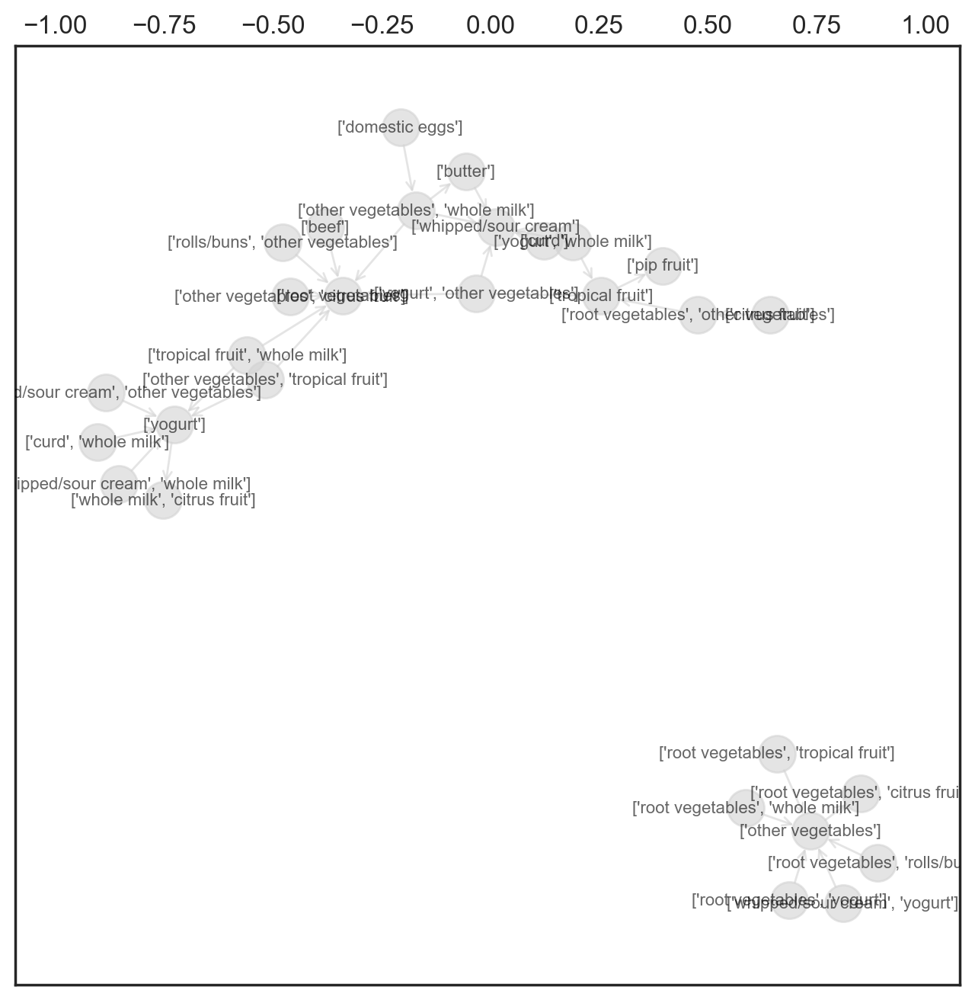

In [74]:
nx.draw_networkx(G,
                 arrows=True,
                 arrowstyle='<-',
                 with_labels=True,
                 cmap='cividis',
                 alpha=0.6,
                 edge_color='lightgray',
                 font_size=8,
                 node_color='lightgrey'
                 # node_color=rules['support'].iloc[:47]
                )

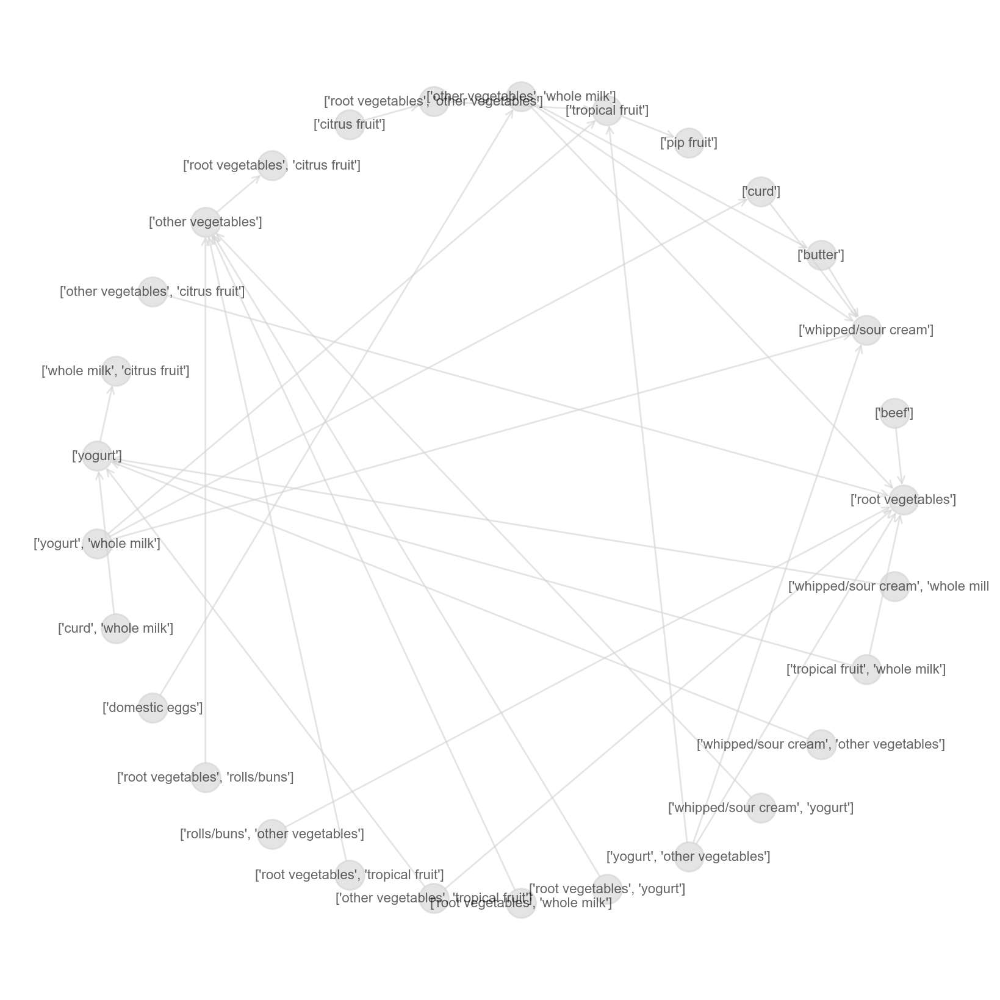

In [75]:
nx.draw_circular(G,
                 arrows=True,
                 arrowstyle='<-',
                 with_labels=True,
                 cmap='cividis',
                 alpha=0.6,
                 edge_color='lightgray',
                 font_size=8,
                 node_color='lightgrey'
                 # node_color=rules.sort_values(['support'])['support'].iloc[:47]
                )

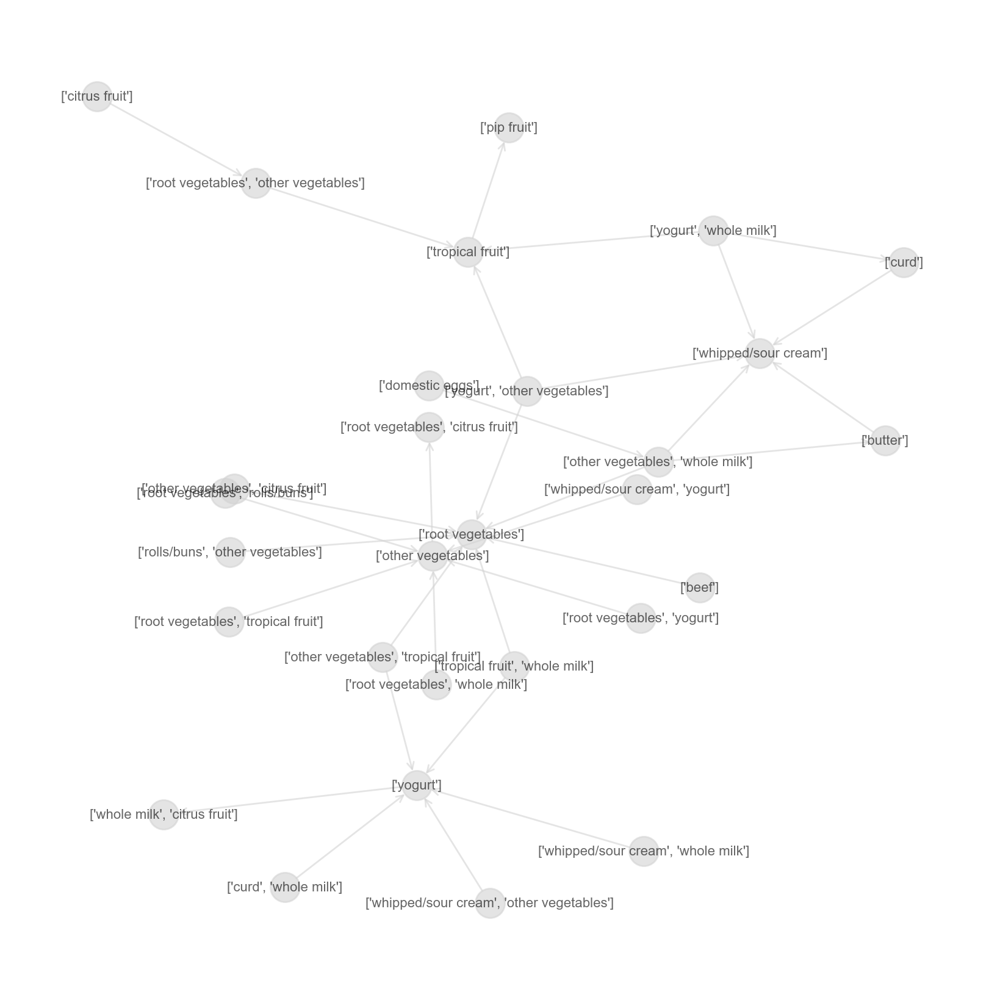

In [76]:
plt.rcParams['figure.figsize']=8,8
nx.draw_kamada_kawai(G,
                 arrows=True,
                 arrowstyle='<-',
                 with_labels=True,
                 cmap='cividis',
                 alpha=0.6,
                 edge_color='lightgray',
                 font_size=8,
                 node_color='lightgrey',
                )

In [77]:
'''
    Created by Nurbek Juraev
'''

import pandas as pd
import matplotlib.pyplot as plt

def catscatter(df,colx,coly,cols,color=['grey','black'],ratio=10,font='Helvetica',save=False,save_name='Default'):
    '''
    Goal: This function create an scatter plot for categorical variables. It's useful to compare two lists with elements in common.
    Input:
        - df: required. pandas DataFrame with at least two columns with categorical variables you want to relate, and the value of both (if it's just an adjacent matrix write 1)
        - colx: required. The name of the column to display horizontaly
        - coly: required. The name of the column to display vertically
        - cols: required. The name of the column with the value between the two variables
        - color: optional. Colors to display in the visualization, the length can be two or three. The two first are the colors for the lines in the matrix, the last one the font color and markers color.
            default ['grey','black']
        - ratio: optional. A ratio for controlling the relative size of the markers.
            default 10
        - font: optional. The font for the ticks on the matrix.
            default 'Helvetica'
        - save: optional. True for saving as an image in the same path as the code.
            default False
        - save_name: optional. The name used for saving the image (then the code ads .png)
            default: "Default"
    Output:
        No output. Matplotlib object is not shown by default to be able to add more changes.
    '''
    # Create a dict to encode the categeories into numbers (sorted)
    colx_codes=dict(zip(df[colx].sort_values().unique(),range(len(df[colx].unique()))))
    coly_codes=dict(zip(df[coly].sort_values(ascending=False).unique(),range(len(df[coly].unique()))))
    
    # Apply the encoding
    df[colx]=df[colx].apply(lambda x: colx_codes[x])
    df[coly]=df[coly].apply(lambda x: coly_codes[x])
    
    
    # Prepare the aspect of the plot
    plt.rcParams['figure.figsize']=8,8 
    plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
    plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True
    plt.rcParams['font.sans-serif']=font
    plt.rcParams['xtick.color']='darkslategrey'
    plt.rcParams['ytick.color']='darkslategrey'
    plt.box(False)

    
    # Plot all the lines for the background
    for num in range(len(coly_codes)):
        plt.hlines(num,-1,len(colx_codes)+1,linewidth=0.5,color='lightgray',alpha=0.8)
    for num in range(len(colx_codes)):
        plt.vlines(num,-1,len(coly_codes)+1,linewidth=0.5,color='lightgray',alpha=0.8)
        
    # Plot the scatter plot with the numbers
    plt.scatter(df[colx],
               df[coly],
               s=df[cols]*ratio,
               zorder=2,
               color='gray')
    
    # Change the ticks numbers to categories and limit them
    plt.xticks(ticks=list(colx_codes.values()),labels=colx_codes.keys(),rotation=90)
    plt.yticks(ticks=list(coly_codes.values()),labels=coly_codes.keys())
    plt.xlim(xmin=-1,xmax=len(colx_codes))
    plt.ylim(ymin=-1,ymax=len(coly_codes))

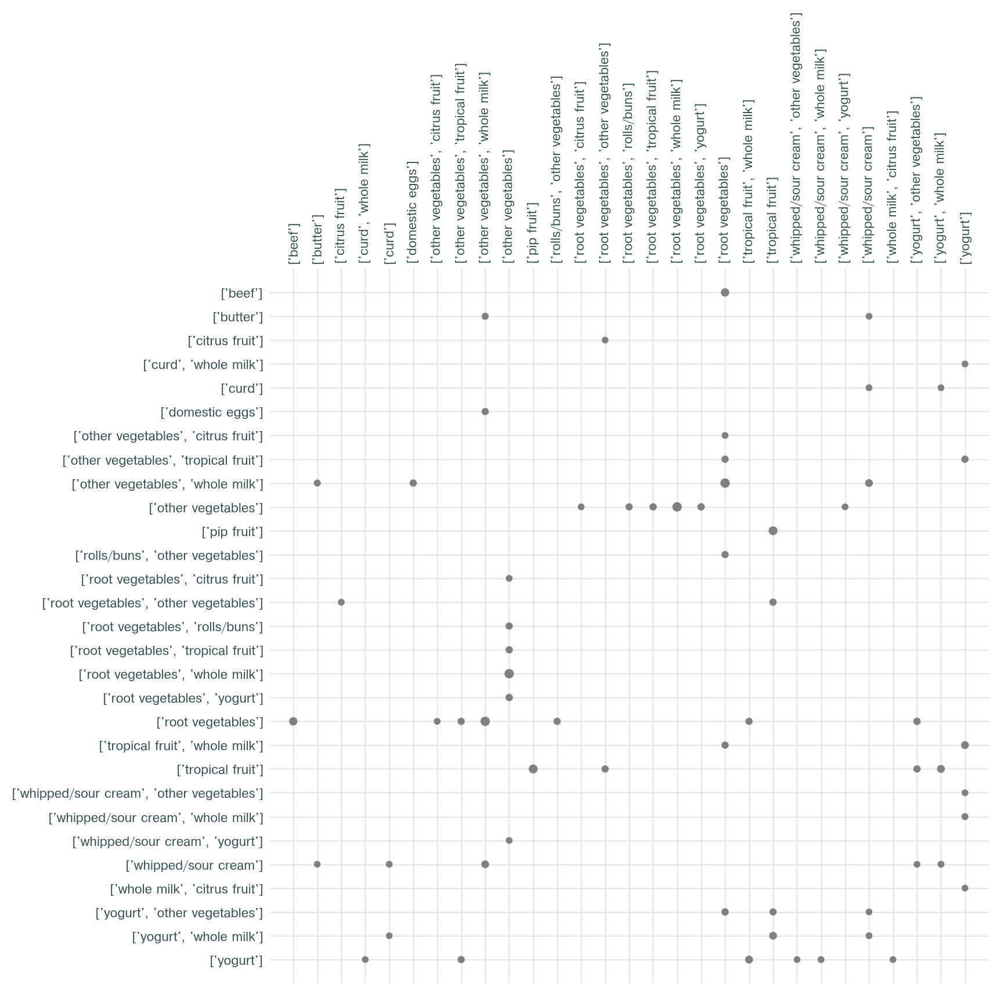

In [78]:
# catscatter(rules,'antecedent','consequent','support')

kcolors=['#F73972','#F2B3C6','#144962']
# create the plot
catscatter(rules,'antecedent','consequent','support',color=kcolors, ratio=1000)
rules['antecedent'] = rules['antecedents'].apply(lambda antecedent: str(list(antecedent)))
rules['consequent'] = rules['consequents'].apply(lambda consequent: str(list(consequent)))
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()